<a href="https://colab.research.google.com/github/ASHISHKUMAR2411/GoogleColab/blob/ashish/DetectronForWholeEPaper.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# This Colab Notebook for using the dataset created at roboflow and verify the Model.

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     |████████████████████████████████| 703.8 MB 23 kB/s 
     |████████████████████████████████| 6.6 MB 15.9 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.12.1+cu113
    Uninstalling torch-1.12.1+cu113:
      Successfully uninstalled torch-1.12.1+cu113
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.13.1+cu113
    Uninstalling torchvision-0.13.1+cu113:
      Successfully uninstalled torchvision-0.13.1+cu113
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.13.1 requires torch==1.12.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.12.1+cu113 requires torch==1.12.1, but you have torch 1.5.0+cu101

In [4]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     |████████████████████████████████| 6.2 MB 4.2 MB/s 
     |████████████████████████████████| 50 kB 4.6 MB/s 
     |████████████████████████████████| 42 kB 1.1 MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.5.post20220512-py3-none-any.whl size=61288 sha256=3ea1f370c4c451eb0cbae0df4b54e9cc05e5f3d7b8de25e5c7584512e6ef2c2e
  Stored in directory: /root/.cache/pip/wheels/68/20/f9/a11a0dd63f4c13678b2a5ec488e48078756505c7777b75b29e
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31549 sha256=0b489a7c5f784bf39dafb3d9ea64abf63dc6ac46557ab11f38ad4388d2fc9d4d
  Stored in directory: /root/.cache/pip/wheels/aa/cc/ed/ca4e88beef656b01c84b9185196513ef2faf74a5a379b043a7
Successfully built fvcore iopath


In [5]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [6]:
!curl -L "https://app.roboflow.com/ds/PQYWAM0xu7?key=1WxRggbZAH" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    503      0  0:00:01  0:00:01 --:--:--   503
100 8054k  100 8054k    0     0  3679k      0  0:00:02  0:00:02 --:--:-- 3679k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/2352__2366__2359__2381__2335__2381__2352__2368__2351__2332__2366__2327__2352__2339_27-6-2022_page-0010_jpg.rf.be3fe582423c26193f69e04329b42d53.jpg  
 extracting: test/27_Jun_2022_page-0016_jpg.rf.6874d07f3cebc75e1462da9db87e1b51.jpg  
 extracting: test/Amar_Ujala_Delhi_2022-06-27_page-0007_jpg.rf.936023b236ef07c3500276cf2756196e.jpg  
 extracting: test/Amar_Ujala_Delhi_2022-06-27_page-0010_jpg.rf.a6d6975d013098311b33e7e430f79c37.jpg  
 extracting: test/Amar_Ujala_Delhi_2022-06-27_page-0011_jpg.rf.4a4a2de6bec2c821a9dd5dccbf28b248.jpg  
 extrac

In [7]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [08/19 14:27:47 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/19 14:27:47 d2.data.datasets.coco]: Loaded 100 images in COCO format from /content/train/_annotations.coco.json


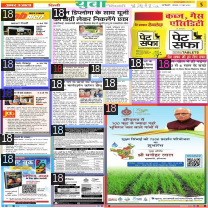

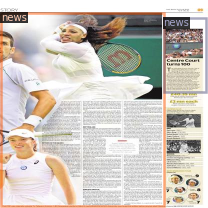

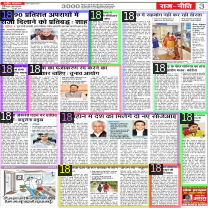

In [8]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [9]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [10]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[08/19 14:28:04 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:06, 60.9MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[08/19 14:28:16 d2.engine.train_loop]: Starting training from iteration 0
[08/19 14:28:53 d2.utils.events]:  eta: 0:44:56  iter: 19  total_loss: 3.129  loss_cls: 1.576  loss_box_reg: 0.805  loss_rpn_cls: 0.631  loss_rpn_loc: 0.082  time: 1.8240  data_time: 0.0275  lr: 0.000020  max_mem: 7235M
[08/19 14:29:32 d2.utils.events]:  eta: 0:47:12  iter: 39  total_loss: 2.447  loss_cls: 1.373  loss_box_reg: 0.868  loss_rpn_cls: 0.143  loss_rpn_loc: 0.063  time: 1.9024  data_time: 0.0124  lr: 0.000040  max_mem: 7235M
[08/19 14:30:13 d2.utils.events]:  eta: 0:47:20  iter: 59  total_loss: 2.221  loss_cls: 1.109  loss_box_reg: 0.937  loss_rpn_cls: 0.083  loss_rpn_loc: 0.060  time: 1.9589  data_time: 0.0138  lr: 0.000060  max_mem: 7235M
[08/19 14:30:54 d2.utils.events]:  eta: 0:46:48  iter: 79  total_loss: 1.990  loss_cls: 0.874  loss_box_reg: 0.970  loss_rpn_cls: 0.065  loss_rpn_loc: 0.050  time: 1.9760  data_time: 0.0137  lr: 0.000080  max_mem: 7235M
[08/19 14:31:36 d2.utils.events]:  eta: 0:46:4

In [11]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [12]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [08/19 15:21:24 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[08/19 15:21:24 d2.data.datasets.coco]: Loaded 16 images in COCO format from /content/test/_annotations.coco.json
[08/19 15:21:24 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   | category   | #instances   |  category  | #instances   |
|:----------:|:-------------|:-----------|:-------------|:----------:|:-------------|
|    News    | 0            | 18         | 94           |    cat     | 0            |
|    news    | 54           |            |              |            |              |
|   total    | 148          |            |              |            |              |
[08/19 15:21:24 d2.data.common]: Serializing 16 elements to byte tensors and concatenating them all ...
[08/19 15:21:24 d2.data.common]: Serialized dataset takes 0.01 MiB
[08/19 15:21:24 d2.evaluation.evaluator]: Start inference on 16 i

OrderedDict([('bbox',
              {'AP': 70.63539610401699,
               'AP50': 83.36040850214086,
               'AP75': 76.55367209754031,
               'APs': nan,
               'APm': 68.76262260242248,
               'APl': 71.97662650950639,
               'AP-News': nan,
               'AP-18': 63.860332492558115,
               'AP-cat': nan,
               'AP-news': 77.41045971547585})])

# Inference with Detectron2 Saved Weights



In [13]:
%ls ./output/

coco_instances_results.json                       last_checkpoint
events.out.tfevents.1660919289.44492209304d.75.0  metrics.json
instances_predictions.pth                         model_final.pth


In [14]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

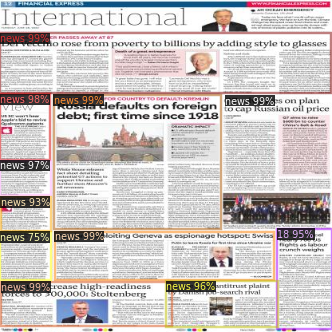

tensor([3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 3], device='cuda:0')
Boxes(tensor([[0.0000e+00, 4.3386e+01, 4.1392e+02, 1.1852e+02],
        [1.5237e+00, 3.5355e+02, 2.1485e+02, 4.0896e+02],
        [6.7488e+01, 1.2032e+02, 2.7670e+02, 2.8798e+02],
        [6.8204e+01, 2.9081e+02, 3.4257e+02, 3.5153e+02],
        [2.8148e+02, 1.2135e+02, 4.1381e+02, 2.4076e+02],
        [1.4825e-01, 1.1957e+02, 6.2452e+01, 2.0111e+02],
        [1.1423e-01, 2.0231e+02, 6.3485e+01, 2.4567e+02],
        [2.0794e+02, 3.5299e+02, 3.4719e+02, 4.1009e+02],
        [3.4664e+02, 2.8744e+02, 4.1512e+02, 4.1176e+02],
        [6.6061e-01, 2.4745e+02, 6.3223e+01, 2.9010e+02],
        [0.0000e+00, 2.9132e+02, 6.3689e+01, 3.5155e+02]], device='cuda:0'))


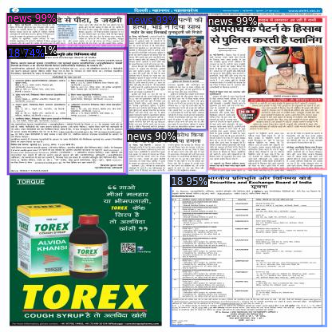

tensor([3, 3, 3, 1, 3, 1, 3], device='cuda:0')
Boxes(tensor([[159.7901,  20.4980, 258.1782, 164.3537],
        [260.2651,  22.7718, 407.3459, 213.0281],
        [  9.0372,  18.9046, 158.0557,  63.3851],
        [213.4040, 221.5137, 407.5240, 407.9355],
        [159.1382, 165.2247, 258.6133, 217.1436],
        [  9.7223,  61.7977, 158.5696, 219.2625],
        [  9.3839,  58.3996, 156.4030, 219.0995]], device='cuda:0'))


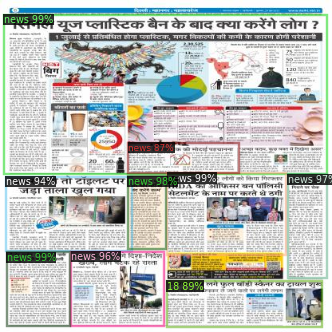

tensor([3, 3, 3, 3, 3, 3, 3, 1, 3], device='cuda:0')
Boxes(tensor([[  8.1671, 316.6672,  87.2119, 408.0996],
        [  4.7516,  20.0955, 409.3033, 219.0675],
        [209.1726, 217.7604, 357.2101, 319.7773],
        [159.9338, 221.9675, 207.1899, 312.2072],
        [359.8505, 219.5322, 408.6159, 348.9632],
        [ 89.1113, 315.7308, 205.5059, 408.2105],
        [  7.4305, 222.2194, 165.1216, 314.7291],
        [208.6011, 352.3695, 403.0928, 410.1897],
        [160.3507, 180.3986, 298.2616, 217.2921]], device='cuda:0'))


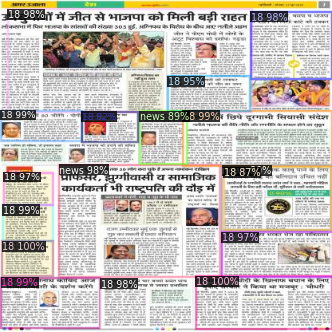

tensor([1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1, 1, 3, 1, 1, 3], device='cuda:0')
Boxes(tensor([[244.5921, 346.4826, 415.3880, 411.9713],
        [  3.0679, 302.9650,  66.0678, 346.1057],
        [228.1449, 140.4229, 415.2967, 208.7139],
        [  3.5181, 257.6468,  65.6768, 302.8447],
        [  1.4087, 139.9512, 102.8490, 178.1779],
        [  1.5897, 348.0721, 125.1977, 411.1657],
        [  9.4785,  13.5971, 315.3228, 142.1187],
        [126.1584, 349.6674, 242.2095, 410.6654],
        [ 74.0500, 207.4903, 275.2971, 347.1823],
        [313.7658,  16.7137, 414.9110, 100.3760],
        [  4.8677, 217.1153,  65.8911, 257.9215],
        [277.2010, 291.6531, 416.0000, 347.8406],
        [209.9665,  97.0482, 312.5868, 139.8913],
        [174.8359, 140.9459, 233.2457, 206.2955],
        [279.5278, 210.6620, 413.3927, 289.3647],
        [102.0545, 141.8385, 172.6239, 179.0753],
        [277.9278, 208.2568, 413.8880, 289.3760]], device='cuda:0'))


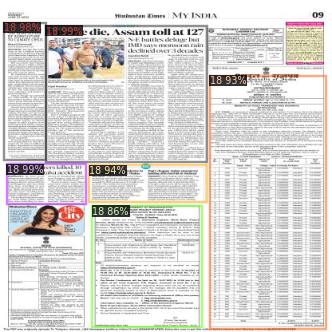

tensor([1, 1, 1, 1, 1, 1], device='cuda:0')
Boxes(tensor([[  8.3561, 206.7965, 106.8851, 256.1471],
        [ 56.9949,  34.0824, 258.3288, 203.4949],
        [  5.0417,  30.0875,  57.8073, 201.1253],
        [111.7411, 208.2769, 259.2685, 254.4178],
        [261.9627,  96.2415, 407.7013, 412.8262],
        [115.4901, 258.8195, 252.7376, 410.2811]], device='cuda:0'))


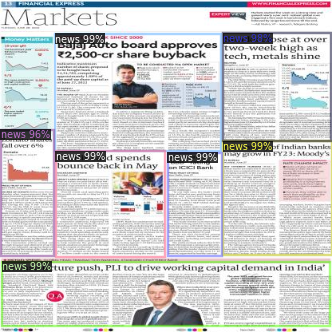

tensor([3, 3, 3, 3, 3, 3, 3], device='cuda:0')
Boxes(tensor([[278.9896, 178.2259, 414.7207, 320.1180],
        [ 69.1402,  44.1368, 275.8993, 190.2064],
        [209.7729, 192.3526, 276.9472, 321.8110],
        [  2.8826, 328.2273, 412.5351, 408.3420],
        [ 69.5281, 190.8775, 206.6727, 322.2541],
        [279.1829,  43.4259, 414.0041, 178.3713],
        [  1.2778, 163.6123,  67.8117, 321.5018]], device='cuda:0'))


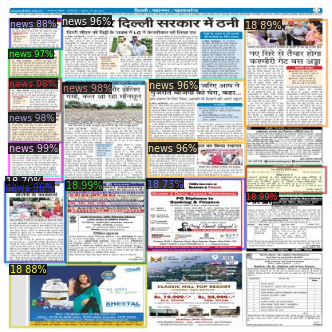

tensor([1, 3, 1, 3, 3, 3, 3, 3, 3, 3, 3, 1, 3, 1, 1, 1], device='cuda:0')
Boxes(tensor([[ 82.5088, 226.8147, 182.5728, 330.0991],
        [ 11.0752, 180.5581,  77.7249, 225.7961],
        [308.0468, 210.3205, 407.8234, 242.1513],
        [ 11.4732, 100.6897,  75.8659, 140.9567],
        [ 11.3965, 142.6816,  77.1252, 178.8616],
        [ 78.1399, 105.4536, 182.6399, 227.3983],
        [ 11.4640,  63.6944,  75.0222,  98.5676],
        [185.2634, 180.3556, 307.2902, 222.8760],
        [ 78.0187,  22.0771, 306.1435, 100.8618],
        [186.7307, 101.6685, 306.0141, 176.7491],
        [  6.7547, 228.8995,  81.3918, 328.3542],
        [306.3470,  26.7296, 408.9527, 159.2621],
        [ 12.9498,  25.4023,  77.6725,  63.1590],
        [ 12.5636, 331.8060, 182.2510, 410.2962],
        [183.3346, 225.0001, 306.4835, 312.4756],
        [  7.3997, 222.0387,  81.5548, 332.3867]], device='cuda:0'))


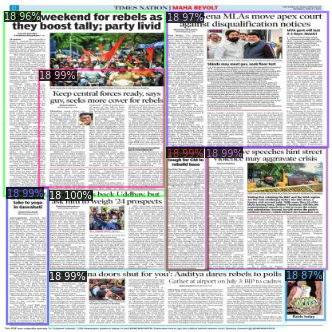

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0')
Boxes(tensor([[ 61.7491, 239.4025, 206.1180, 337.9895],
        [257.0486, 186.3102, 408.7989, 337.9645],
        [ 61.8481, 340.1938, 354.7396, 409.1562],
        [ 49.1457,  89.7204, 205.3131, 234.7331],
        [208.5793, 186.3173, 259.5439, 339.2005],
        [  8.4538, 236.3937,  60.3134, 406.4048],
        [208.1307,  17.2019, 410.2890, 185.2710],
        [  5.2622,  16.3795, 206.6803, 246.2060],
        [356.9137, 339.5209, 406.5050, 401.2737]], device='cuda:0'))


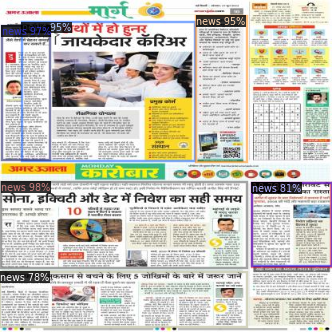

tensor([3, 3, 3, 3, 3, 3, 1], device='cuda:0')
Boxes(tensor([[  1.8422, 228.8954, 309.3507, 336.3810],
        [  1.9510,  34.3864,  62.7533, 201.2138],
        [ 27.6043,  29.8789, 243.4282, 202.6581],
        [245.5900,  21.8017, 309.0858, 204.0948],
        [315.5037, 230.2265, 415.2025, 333.2772],
        [  0.0000, 341.3282, 308.4600, 409.8119],
        [315.1958, 229.8080, 414.3360, 334.3432]], device='cuda:0'))


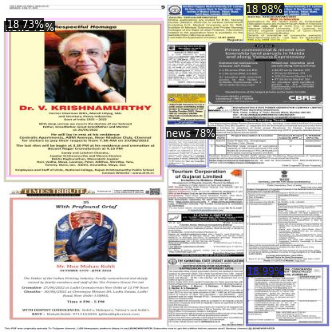

tensor([1, 1, 3, 1, 3], device='cuda:0')
Boxes(tensor([[308.3799, 333.8925, 409.3989, 407.7697],
        [307.8241,   7.0706, 406.0565,  53.5254],
        [208.0198, 161.6836, 259.4236, 209.0679],
        [  8.3137,  25.7839, 202.3712, 221.0213],
        [  6.4033,  29.0586, 203.9933, 228.1756]], device='cuda:0'))


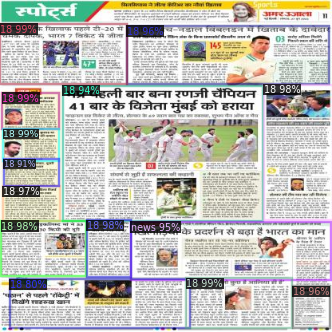

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 1, 1, 1], device='cuda:0')
Boxes(tensor([[4.1144e-01, 3.1852e+01, 1.5851e+02, 1.0691e+02],
        [3.0031e+00, 1.1779e+02, 7.3367e+01, 1.6311e+02],
        [2.3277e+02, 3.4897e+02, 3.6553e+02, 4.1050e+02],
        [4.2610e+00, 1.6330e+02, 7.3519e+01, 2.0338e+02],
        [1.0818e+02, 2.7695e+02, 1.6413e+02, 3.4709e+02],
        [3.2979e+02, 1.0756e+02, 4.1580e+02, 2.7689e+02],
        [1.5586e+00, 2.7746e+02, 1.0765e+02, 3.4648e+02],
        [3.7197e+00, 2.3447e+02, 7.5248e+01, 2.7733e+02],
        [3.6616e+02, 3.5916e+02, 4.1300e+02, 4.1069e+02],
        [1.5881e+02, 3.4267e+01, 4.1179e+02, 1.0733e+02],
        [1.6382e+02, 2.7872e+02, 4.1331e+02, 3.5054e+02],
        [7.8914e+01, 1.0880e+02, 3.2928e+02, 2.7788e+02],
        [4.8931e+00, 2.0086e+02, 7.3427e+01, 2.3339e+02],
        [1.2016e+01, 3.5051e+02, 2.3758e+02, 4.1132e+02]], device='cuda:0'))


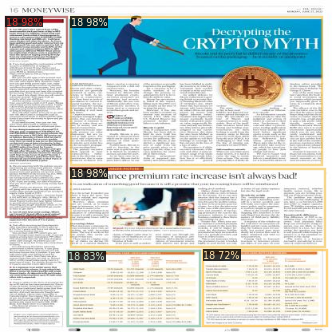

tensor([1, 1, 1, 1, 1], device='cuda:0')
Boxes(tensor([[ 88.4865, 212.2345, 406.4624, 309.3893],
        [  7.3467,  22.9082,  84.1662, 272.0926],
        [ 88.3742,  23.1710, 403.0015, 207.7683],
        [ 85.5312, 315.4835, 250.5542, 408.0165],
        [254.1894, 313.8628, 408.7562, 408.4929]], device='cuda:0'))


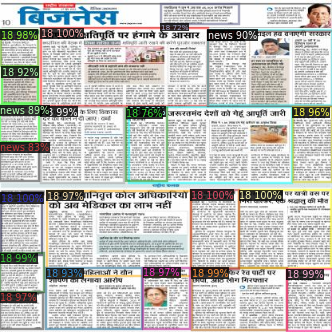

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 3, 3, 3, 1, 1],
       device='cuda:0')
Boxes(tensor([[2.3872e+02, 2.3888e+02, 2.9885e+02, 3.3723e+02],
        [5.0776e+01, 3.7548e+01, 2.5983e+02, 1.3372e+02],
        [1.1359e+00, 2.4265e+02, 5.2758e+01, 3.1955e+02],
        [2.9904e+02, 2.3922e+02, 4.1419e+02, 3.3588e+02],
        [5.1052e+01, 1.3506e+02, 1.5546e+02, 2.2978e+02],
        [1.6143e+02, 1.3498e+02, 3.6440e+02, 2.3012e+02],
        [3.5818e+02, 3.3781e+02, 4.1541e+02, 4.1427e+02],
        [2.3967e+02, 3.3633e+02, 3.5878e+02, 4.1308e+02],
        [3.5404e-01, 3.1794e+02, 5.5136e+01, 3.6607e+02],
        [8.5747e-01, 3.9145e+01, 4.7627e+01, 8.4893e+01],
        [5.6107e-02, 3.6698e+02, 5.3723e+01, 4.1217e+02],
        [1.7926e+02, 3.3572e+02, 2.3715e+02, 4.1241e+02],
        [5.8296e+01, 2.3992e+02, 2.3891e+02, 3.4601e+02],
        [2.6009e+02, 4.0202e+01, 4.1578e+02, 1.3448e+02],
        [3.6579e+02, 1.3568e+02, 4.1512e+02, 2.2922e+02],
        [5.7924e+01, 3.36

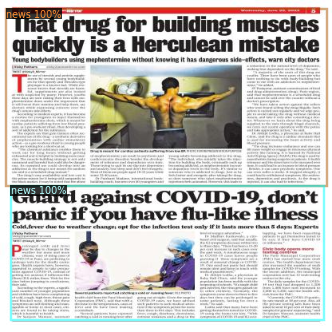

tensor([3, 3], device='cuda:0')
Boxes(tensor([[  7.9675,  12.9923, 408.7840, 234.2150],
        [ 13.9144, 233.5187, 404.6530, 401.3920]], device='cuda:0'))


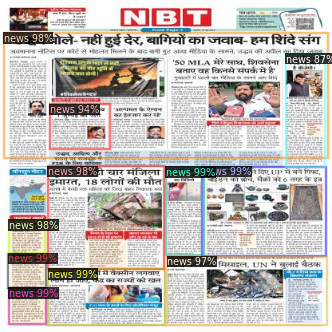

tensor([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3], device='cuda:0')
Boxes(tensor([[ 10.9505, 360.9738,  57.9057, 406.0972],
        [ 10.5078, 318.3484,  57.5869, 360.9665],
        [207.0826, 210.1308, 254.9202, 320.6017],
        [ 60.4775, 337.3228, 206.3007, 407.3944],
        [252.1445, 209.7505, 407.9937, 321.2893],
        [ 11.1791, 276.5510,  56.4514, 318.0906],
        [  4.4294,  43.0476, 409.6622, 199.3336],
        [ 59.7918, 209.2760, 204.8881, 337.8183],
        [209.0292, 322.0303, 409.2406, 407.7608],
        [ 62.4237, 132.0689, 136.9099, 188.3882],
        [357.1670,  69.0205, 406.4744, 209.7193]], device='cuda:0'))


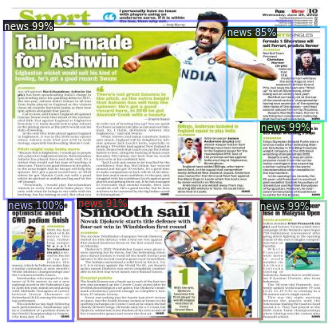

tensor([3, 3, 3, 3, 3, 3], device='cuda:0')
Boxes(tensor([[ 10.5222, 251.4663,  90.8537, 402.9008],
        [325.5594, 252.3046, 407.6184, 403.5259],
        [  4.8606,  27.8274, 365.0859, 249.6692],
        [325.8523, 154.2277, 403.8257, 249.0945],
        [ 97.2598, 249.5902, 327.8389, 400.2810],
        [283.7517,  36.1952, 406.9461, 152.6128]], device='cuda:0'))


In [15]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print(outputs["instances"].pred_classes)
  print(outputs["instances"].pred_boxes)
